In [213]:
import numpy as np
import pandas as pd

In [215]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
import altair as alt
plt.style.use('ggplot')

In [217]:
df=pd.read_csv(r"C:\Users\Ellen\Desktop\Air\EDA\Stations EDA\Dataset\TLA_merged_imputed.xlsx.csv")
df.head(5)

,datetime,direct_radiation,PM25_TLA,PM10_TLA,SO2_TLA,O3_TLA,NO2_TLA,CO_TLA,RH_TLA,TMP_TLA,WDR_TLA,WSP_TLA,is_festival,is_weekend,AirQualityIndex
0,2020-11-25 01:00:00,0,19.781250,41.166667,4.0,4.0,32.0,0.4,42.0,13.6,316.0,2.0,0,0,2
1,2020-11-25 02:00:00,0,23.593750,41.395833,3.0,5.0,27.0,0.2,45.0,12.6,317.0,1.9,0,0,2
2,2020-11-25 03:00:00,0,22.500000,46.531250,2.0,6.0,24.0,0.1,47.0,11.9,316.0,2.2,0,0,3
3,2020-11-25 04:00:00,0,26.500000,46.302083,2.0,9.0,20.0,0.1,48.0,11.3,317.0,2.0,0,0,4
4,2020-11-25 05:00:00,0,26.760417,41.822917,1.0,7.0,22.0,0.1,49.0,10.8,317.0,1.6,0,0,4


In [219]:
print(df.dtypes)


datetime             object
direct_radiation      int64
PM25_TLA            float64
PM10_TLA            float64
SO2_TLA             float64
O3_TLA              float64
NO2_TLA             float64
CO_TLA              float64
RH_TLA              float64
TMP_TLA             float64
WDR_TLA             float64
WSP_TLA             float64
is_festival           int64
is_weekend            int64
AirQualityIndex       int64
dtype: object


In [221]:
# Convert 'datetime' column to datetime type if not already done
df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')

# Check for any NaT values
if df['datetime'].isna().any():
    print("There are NaT values in the datetime column:")
    print(df[df['datetime'].isna()])

# Set 'datetime' as index
df.set_index('datetime', inplace=True)

# Check the index type
print(df.index)
print(type(df.index))


DatetimeIndex(['2020-11-25 01:00:00', '2020-11-25 02:00:00',
               '2020-11-25 03:00:00', '2020-11-25 04:00:00',
               '2020-11-25 05:00:00', '2020-11-25 06:00:00',
               '2020-11-25 07:00:00', '2020-11-25 08:00:00',
               '2020-11-25 09:00:00', '2020-11-25 10:00:00',
               ...
               '2023-12-30 16:00:00', '2023-12-30 17:00:00',
               '2023-12-30 18:00:00', '2023-12-30 19:00:00',
               '2023-12-30 20:00:00', '2023-12-30 21:00:00',
               '2023-12-30 22:00:00', '2023-12-30 23:00:00',
               '2023-12-31 00:00:00', '2024-01-01 00:00:00'],
              dtype='datetime64[ns]', name='datetime', length=26788, freq=None)
<class 'pandas.core.indexes.datetimes.DatetimeIndex'>


In [223]:
df['month'] = df.index.month
df['hour'] = df.index.hour


# Time Series Analysis

**1. Analyze AQI (By Season and Temporal Patterns):** Overall Trends in AQI

In [226]:
df.reset_index(inplace=True)
df['datetime'] = pd.to_datetime(df['datetime'])
df.set_index('datetime', inplace=True)

# Resample data for daily and monthly averages
daily_data = df.resample('D').mean()
monthly_data = df.resample('ME').mean()

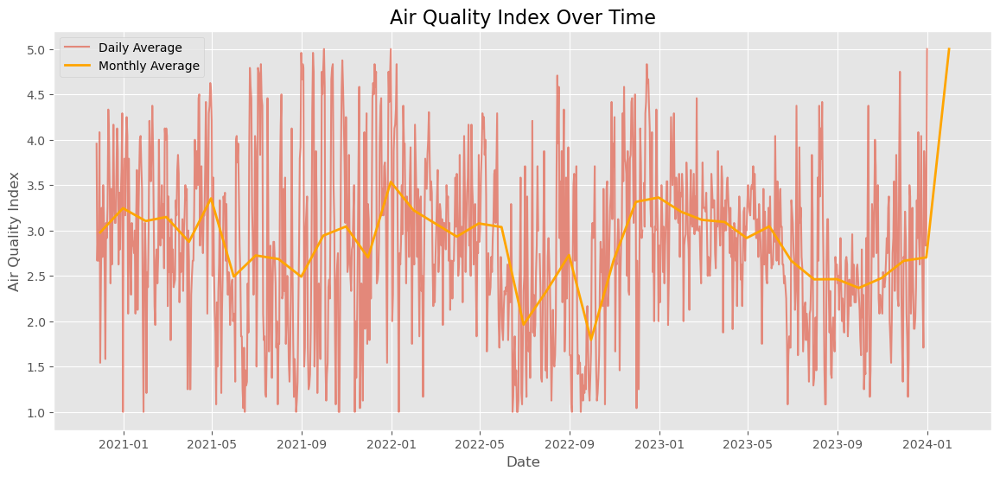

In [228]:
plt.figure(figsize=(14, 6))
plt.plot(daily_data.index, daily_data['AirQualityIndex'], label='Daily Average', alpha=0.6)
plt.plot(monthly_data.index, monthly_data['AirQualityIndex'], label='Monthly Average', linewidth=2, color='orange')
plt.title('Air Quality Index Over Time', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Air Quality Index', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

# Summary of Air Quality Index Insights

Daily Air Quality Index (AQI):

Average AQI: 2.84
Median AQI: 2.83
Range: 1.00 (min) to 5.00 (max)
Standard Deviation: 0.91, indicating moderate variability in daily AQI values.
Monthly Air Quality Index (AQI):

Average AQI: 2.90
Median AQI: 2.93
Range: 1.79 (min) to 5.00 (max)
Standard Deviation: 0.51, showing lower variability compared to daily AQI.
Conclusion
Both daily and monthly AQI averages are relatively low, suggesting generally good air quality, but with occasional peaks (up to 5.00). The variability in daily AQI indicates fluctuations in air quality that may warrant further investigation.

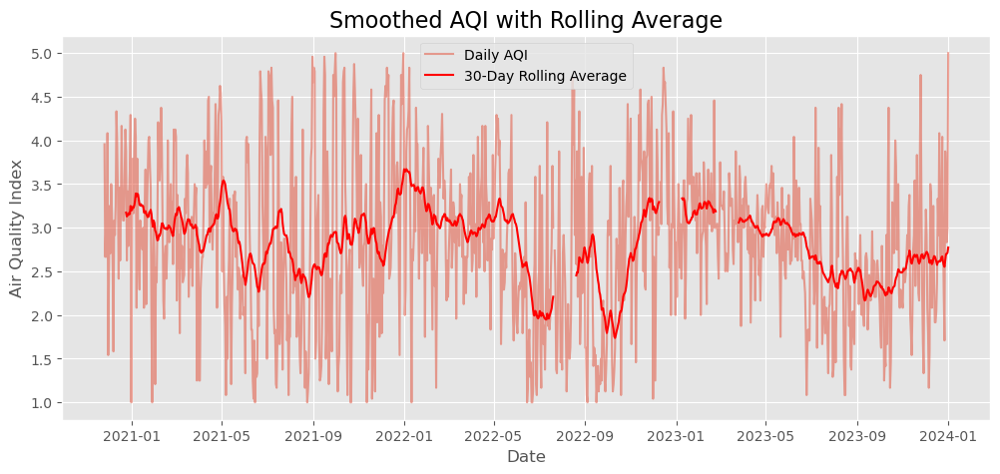

In [233]:
rolling_avg = daily_data['AirQualityIndex'].rolling(window=30).mean()

plt.figure(figsize=(12, 5))
plt.plot(daily_data.index, daily_data['AirQualityIndex'], label='Daily AQI', alpha=0.5)
plt.plot(daily_data.index, rolling_avg, label='30-Day Rolling Average', color='red')
plt.title('Smoothed AQI with Rolling Average', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Air Quality Index', fontsize=12)
plt.legend()
plt.grid(True)
plt.show()

**Summary of Air Quality Index Findings**

**Daily AQI:** Mean: 2.84, Median: 2.83, Max: 5.00, Min: 1.00

**30-Day Rolling Average AQI:** Mean: 2.82, Median: 2.92, Max: 3.67, Min: 1.74

Overall, the daily air quality index remains **relatively stable,** with values generally below the maximum threshold, indicating a moderate air quality level over the observed period. The rolling average reflects **consistent air quality**, with minor fluctuations.

# 365 day rolling average of AQI

In [239]:
print(df.columns)


Index(['direct_radiation', 'PM25_TLA', 'PM10_TLA', 'SO2_TLA', 'O3_TLA',
       'NO2_TLA', 'CO_TLA', 'RH_TLA', 'TMP_TLA', 'WDR_TLA', 'WSP_TLA',
       'is_festival', 'is_weekend', 'AirQualityIndex', 'month', 'hour'],
      dtype='object')


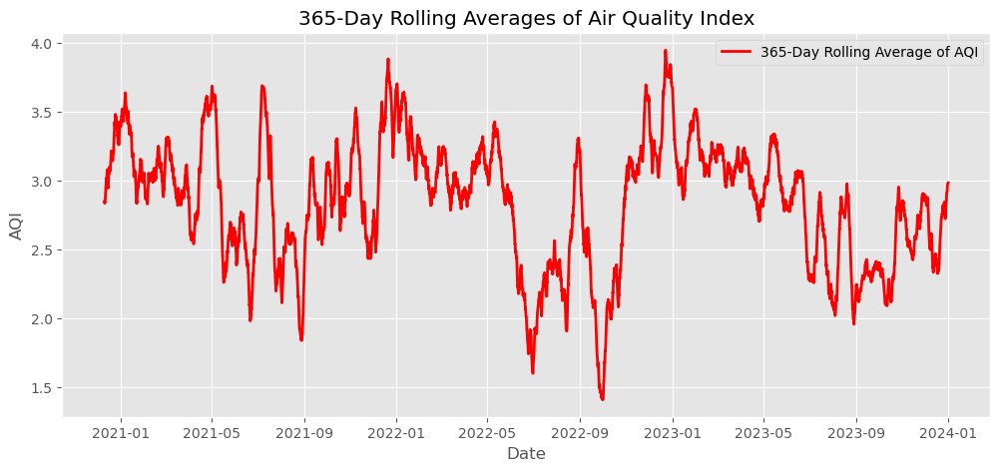

365-Day Rolling Average Summary:
count    26424.000000
mean         2.833958
std          0.452573
min          1.408219
25%          2.512329
50%          2.895890
75%          3.147945
max          3.945205
Name: 365_day_avg, dtype: float64


In [241]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is your DataFrame and already has the 'AirQualityIndex' column
# Step 1: Calculate the 365-day rolling average of the AirQualityIndex
df['365_day_avg'] = df['AirQualityIndex'].rolling(window=365).mean()

# Step 2: Plot the trends
plt.figure(figsize=(12, 5))
plt.plot(df.index, df['365_day_avg'], label='365-Day Rolling Average of AQI', color='red', linewidth=2)
plt.title('365-Day Rolling Averages of Air Quality Index')
plt.xlabel('Date')
plt.ylabel('AQI')
plt.legend()
plt.grid(True)
plt.show()

# Step 3: Print summary statistics for the rolling average
rolling_avg_summary = df['365_day_avg'].describe()
print("365-Day Rolling Average Summary:")
print(rolling_avg_summary)


**Summary of Air Quality Index Findings** 

Overall, the 365-day rolling average air quality index indicates a **moderate air quality level,** with values consistently below the maximum threshold. The stability of the mean and median suggests relatively consistent air quality, with occasional fluctuations noted by the maximum and minimum values.

# Decompose Time Series plot

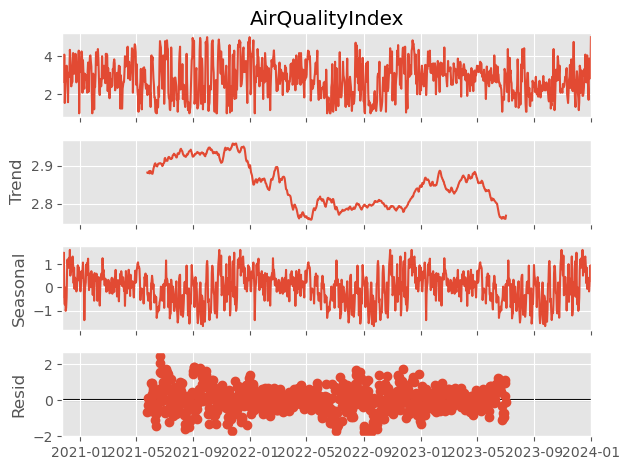

In [114]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Decompose the time series into trend, seasonality, and residuals
decomposition = seasonal_decompose(daily_data['AirQualityIndex'].dropna(), model='additive', period=365)

# Plot the decomposed components
decomposition.plot()
plt.show()

In [250]:
# Print summary of the decomposed components
trend = decomposition.trend.dropna()
seasonal = decomposition.seasonal.dropna()
residual = decomposition.resid.dropna()

# Calculate summary statistics for each component
trend_summary = trend.describe()
seasonal_summary = seasonal.describe()
residual_summary = residual.describe()

# Print the summaries
print("Trend Component Summary:")
print(trend_summary)
print("\nSeasonal Component Summary:")
print(seasonal_summary)
print("\nResidual Component Summary:")
print(residual_summary)

# Additional insights based on the decomposition
print("\nAdditional Insights:")
print(f"Mean of Trend Component: {trend.mean():.2f}")
print(f"Mean of Seasonal Component: {seasonal.mean():.2f}")
print(f"Mean of Residual Component: {residual.mean():.2f}")


Trend Component Summary:
count    766.000000
mean       2.851604
std        0.057689
min        2.758487
25%        2.797465
50%        2.849717
75%        2.905223
max        2.958974
Name: trend, dtype: float64

Seasonal Component Summary:
count    1130.000000
mean        0.014576
std         0.671400
min        -1.666475
25%        -0.398969
50%         0.069032
75%         0.442943
max         1.615493
Name: seasonal, dtype: float64

Residual Component Summary:
count    766.000000
mean       0.028235
std        0.671095
min       -1.802514
25%       -0.396311
50%        0.015894
75%        0.444798
max        2.449121
Name: resid, dtype: float64

Additional Insights:
Mean of Trend Component: 2.85
Mean of Seasonal Component: 0.01
Mean of Residual Component: 0.03


# Summary of Air Quality Index Decomposition Findings

**Trend Component**
Mean Value: The average trend component is 2.85, indicating a **stable underlying level** of pollution over time.
Variation: The standard deviation is low (0.0577), suggesting consistency in pollutant levels, with values ranging from a minimum of 2.76 to a maximum of 2.96.

**Seasonal Component**
Mean Value: The average seasonal component is close to zero (0.01), indicating **minimal seasonal fluctuation** in pollution levels.
Range: Seasonal variations are present, with a standard deviation of 0.6714, ranging from -1.67 to 1.62, highlighting some **periodic increases and decreases** in pollution levels.

**Residual Component**
Mean Value: The residual component has a mean of 0.03, which indicates **slight random fluctuations** around the trend.
Variation: With a standard deviation of 0.6711, the residuals range from -1.80 to 2.45, suggesting that there are instances of **unexpected spikes or drops** in pollution levels not explained by the trend or seasonality.

**Additional Insights**
The stability of the trend component implies that, while there may be seasonal effects, the overall pollution level remains **relatively consistent.**
The presence of both seasonal and residual variations indicates that other factors may influence pollution levels intermittently, warranting further investigation into their causes.

# Effect of Weather on AQI 

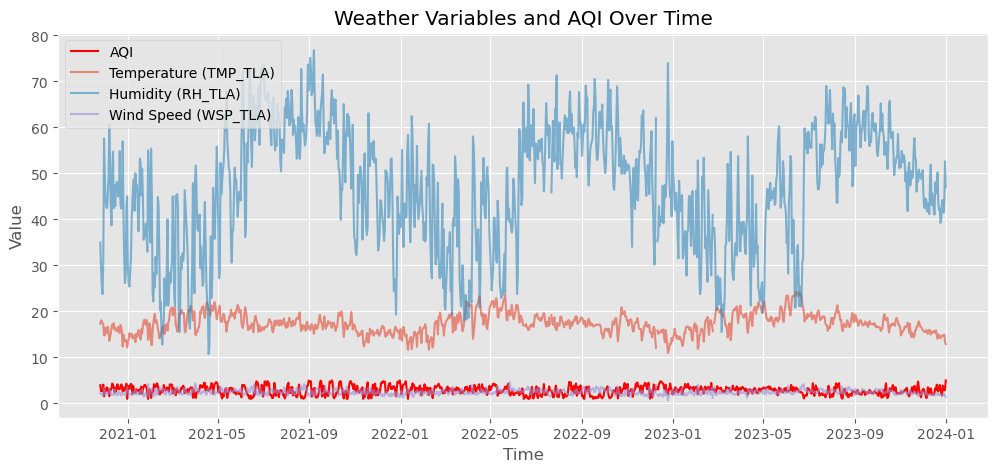

In [119]:
plt.figure(figsize=(12, 5))
plt.plot(daily_data.index, daily_data['AirQualityIndex'], label='AQI', color='red')
plt.plot(daily_data.index, daily_data['TMP_TLA'], label='Temperature (TMP_TLA)', alpha=0.6)
plt.plot(daily_data.index, daily_data['RH_TLA'], label='Humidity (RH_TLA)', alpha=0.6)
plt.plot(daily_data.index, daily_data['WSP_TLA'], label='Wind Speed (WSP_TLA)', alpha=0.6)
plt.legend()
plt.title('Weather Variables and AQI Over Time')
plt.xlabel('Time')
plt.ylabel('Value')
plt.grid(True)
plt.show()

# Summary of Findings

1. The AQI shows **moderate air quality levels** with values generally below the maximum threshold, while **temperature and humidity** levels remain within a comfortable range. 
2. Wind speed varies but is **generally low**, potentially impacting pollutant dispersion.
3. Overall, the data indicates a relationship between **weather variables and air quality.**

In [256]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from plotly.subplots import make_subplots  # Fix the NameError
import plotly.graph_objects as go  # Required for go.Bar and go.Scatter

In [258]:
# Display the columns in the DataFrame
print(df.columns)


Index(['direct_radiation', 'PM25_TLA', 'PM10_TLA', 'SO2_TLA', 'O3_TLA',
       'NO2_TLA', 'CO_TLA', 'RH_TLA', 'TMP_TLA', 'WDR_TLA', 'WSP_TLA',
       'is_festival', 'is_weekend', 'AirQualityIndex', 'month', 'hour',
       '365_day_avg'],
      dtype='object')


In [260]:
monthly_hourly_aqi = df.groupby(['month', 'hour'])['AirQualityIndex'].mean().unstack()


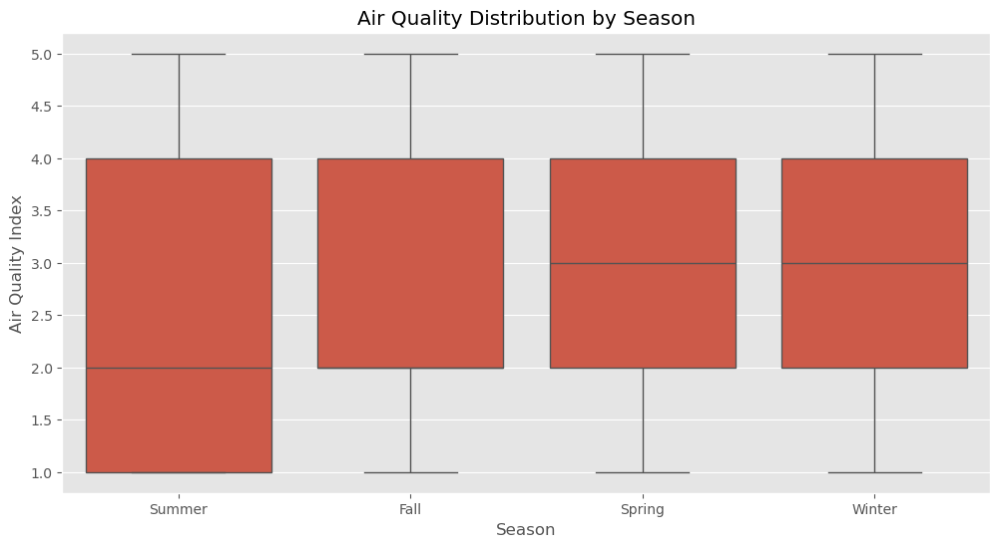


Summer (Rank 1):
- Average AQI: 2.50
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 17.72
  * PM10: 35.44
  * O3: 25.85
  * NO2: 23.24


Fall (Rank 2):
- Average AQI: 2.67
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 19.74
  * PM10: 42.87
  * O3: 23.42
  * NO2: 26.08


Spring (Rank 3):
- Average AQI: 2.98
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 24.40
  * PM10: 50.21
  * O3: 34.65
  * NO2: 28.54


Winter (Rank 4):
- Average AQI: 3.17
- AQI Range: 1.00 - 5.00
- Primary Pollutants:
  * PM2.5: 23.77
  * PM10: 54.27
  * O3: 22.64
  * NO2: 33.25



In [262]:
def analyze_seasonal_air_quality(df):
    """
    Analyze and rank air quality across seasons
    """
    # Create season mapping
    season_mapping = {
        12: 'Winter', 1: 'Winter', 2: 'Winter',
        3: 'Spring', 4: 'Spring', 5: 'Spring',
        6: 'Summer', 7: 'Summer', 8: 'Summer',
        9: 'Fall', 10: 'Fall', 11: 'Fall'
    }

    # Add season column using the index
    df['season'] = df.index.month.map(season_mapping)

    # Calculate seasonal metrics
    seasonal_metrics = df.groupby('season').agg({
        'AirQualityIndex': ['mean', 'median', 'std', 'min', 'max'],
        'PM25_TLA': 'mean',
        'PM10_TLA': 'mean',
        'SO2_TLA': 'mean',
        'O3_TLA': 'mean',
        'NO2_TLA': 'mean',
        'CO_TLA': 'mean'
    }).round(2)

    # Flatten column names
    seasonal_metrics.columns = ['_'.join(col).strip() for col in seasonal_metrics.columns.values]

    # Calculate overall rank (based on mean AQI, lower is better)
    seasonal_metrics['overall_rank'] = seasonal_metrics['AirQualityIndex_mean'].rank()
    
    # Sort by mean AQI
    seasonal_metrics = seasonal_metrics.sort_values('AirQualityIndex_mean')

    return seasonal_metrics

def create_seasonal_visualizations(df, seasonal_metrics):
    """
    Create visualizations for seasonal air quality analysis
    """
    # 1. Season Ranking Box Plot
    fig1 = plt.figure(figsize=(12, 6))
    sns.boxplot(x='season', y='AirQualityIndex', data=df,
                order=seasonal_metrics.index)
    plt.title('Air Quality Distribution by Season')
    plt.xlabel('Season')
    plt.ylabel('Air Quality Index')

# 2. Create detailed pollutant comparison
    fig2 = make_subplots(rows=2, cols=1,
                        subplot_titles=('Average AQI by Season',
                                      'Pollutant Levels by Season'))

    # Add AQI bar chart
    fig2.add_trace(
        go.Bar(x=seasonal_metrics.index,
               y=seasonal_metrics['AirQualityIndex_mean'],
               name='Average AQI',
               text=seasonal_metrics['overall_rank'].astype(int).astype(str),
               textposition='outside'),
        row=1, col=1
    )

    # Add pollutant lines
    pollutants = ['PM25_TLA', 'PM10_TLA', 'SO2_TLA',
                  'O3_TLA', 'NO2_TLA', 'CO_TLA']

    for pollutant in pollutants:
        fig2.add_trace(
            go.Scatter(x=seasonal_metrics.index,
                      y=seasonal_metrics[f'{pollutant}_mean'],
                      name=pollutant,
                      mode='lines+markers'),
            row=2, col=1
        )

    fig2.update_layout(height=800, width=1000,
                      title_text="Seasonal Air Quality Analysis",
                      showlegend=True)

    return fig1, fig2

def generate_seasonal_summary(seasonal_metrics):
    """
    Generate a detailed summary of seasonal air quality rankings
    """
    # Sort by AQI mean for ranking
    ranked_seasons = seasonal_metrics.sort_values('AirQualityIndex_mean')

    summary = []
    for season in ranked_seasons.index:
        metrics = ranked_seasons.loc[season]
        summary.append(f"""
{season} (Rank {int(metrics['overall_rank'])}):
- Average AQI: {metrics['AirQualityIndex_mean']:.2f}
- AQI Range: {metrics['AirQualityIndex_min']:.2f} - {metrics['AirQualityIndex_max']:.2f}
- Primary Pollutants:
  * PM2.5: {metrics['PM25_TLA_mean']:.2f}
  * PM10: {metrics['PM10_TLA_mean']:.2f}
  * O3: {metrics['O3_TLA_mean']:.2f}
  * NO2: {metrics['NO2_TLA_mean']:.2f}
""")

    return '\n'.join(summary)

seasonal_metrics = analyze_seasonal_air_quality(df)
fig1, fig2 = create_seasonal_visualizations(df, seasonal_metrics)
summary = generate_seasonal_summary(seasonal_metrics)
plt.show()  # For Matplotlib
fig2.show(renderer="notebook")  # Use "browser" if not in Jupyter
print(summary)


# Key Insights:

1. Summer has the **best air quality** with the lowest AQI and pollutant levels.
2. Winter has the **worst air quality,** with the highest PM10 and NO2 levels, likely due to seasonal pollution buildup.
3. **PM10 and NO2** levels are highest in winter, suggesting increased emissions and stagnant air conditions.
4. Spring shows a **sharp increase in O3 levels,** possibly due to increased sunlight and photochemical reactions.
5. Fall represents a **transitional period,** with moderate air quality but increasing pollutant concentrations.

In [267]:
# Function to create temporal patterns plot
def create_temporal_patterns_plot(df):
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Hourly AQI Patterns',
                        'Monthly AQI Patterns',
                        'Weekend Effect',
                        'Festival Effect')
    )

    hourly_aqi = df.groupby('hour')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Scatter(x=hourly_aqi.index,
                   y=hourly_aqi.values,
                   mode='lines+markers'),
        row=1, col=1
    )

    seasonal_aqi = df.groupby('Month')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Bar(x=['Summer', 'Fall', 'Winter', 'Spring', ],
               y=seasonal_aqi.values),
        row=1, col=2
    )

    weekend_aqi = df.groupby('is_weekend')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Bar(x=['Weekday', 'Weekend'],
               y=weekend_aqi.values),
        row=2, col=1
    )
    festival_aqi = df.groupby('is_festival')['AirQualityIndex'].mean()
    fig.add_trace(
        go.Bar(x=['Non-Festival', 'Festival'],
               y=festival_aqi.values),
        row=2, col=2
    )

    fig.update_layout(height=800,
                      width=1200,
                      showlegend=False,
                      title_text="Temporal Patterns in Air Quality")
    return fig

# Function to create pollutant relationships plot
def create_pollutant_relationships_plot(df):
    fig = px.scatter_matrix(
        df,
        dimensions=['PM25_TLA', 'PM10_TLA', 'SO2_TLA',
                    'O3_TLA', 'NO2_TLA', 'CO_TLA'],
        color='AirQualityIndex',
        title="Relationships Between Different Pollutants"
    )
    fig.update_layout(height=1000, width=1000)
    return fig

In [269]:
# Extract hour and month from the datetime index
df['hour'] = df.index.hour
df['Month'] = df.index.month


In [273]:
# Summarize Pollutant Data
pollutant_summary = df[['PM25_TLA', 'PM10_TLA', 'SO2_TLA', 'O3_TLA', 'NO2_TLA', 'CO_TLA']].describe()
print("Pollutant Summary Statistics:\n", pollutant_summary, "\n")


Pollutant Summary Statistics:
            PM25_TLA      PM10_TLA       SO2_TLA        O3_TLA       NO2_TLA  \
count  26788.000000  26788.000000  26788.000000  26788.000000  26788.000000   
mean      21.437649     45.809974      5.355453     26.579350     27.845410   
std       11.611682     23.220501      8.136410     24.578934     12.233433   
min        1.000000      1.000000      0.000000      0.000000      3.000000   
25%       13.000000     30.000000      2.000000      7.000000     19.000000   
50%       19.614583     42.000000      3.000000     18.578125     26.000000   
75%       28.000000     58.000000      5.052083     40.000000     34.000000   
max      105.000000    550.000000    179.000000    149.000000    110.000000   

             CO_TLA  
count  26788.000000  
mean       0.451654  
std        0.337856  
min        0.000000  
25%        0.220833  
50%        0.360000  
75%        0.580000  
max        3.200000   



**PM2.5 & PM10:** The mean values (21.44 µg/m³ and 45.81 µg/m³) suggest moderate pollution, but the high standard deviation and max values indicate occasional extreme spikes. PM10 reaching 550 µg/m³ is quite alarming.

**SO₂ & NO₂:** While the median SO₂ levels are low (3 µg/m³), the max of 179 µg/m³ suggests occasional severe pollution events. NO₂ levels (mean ~27.85 µg/m³) are relatively high, which could be linked to traffic and industrial emissions.

**O₃ (Ozone):** The mean of 26.58 µg/m³ isn't extreme, but the max (149 µg/m³) suggests significant fluctuations.

**CO (Carbon Monoxide):** The mean (0.45 ppm) and max (3.2 ppm) are within common urban exposure limits, but localized spikes could indicate combustion-related pollution.

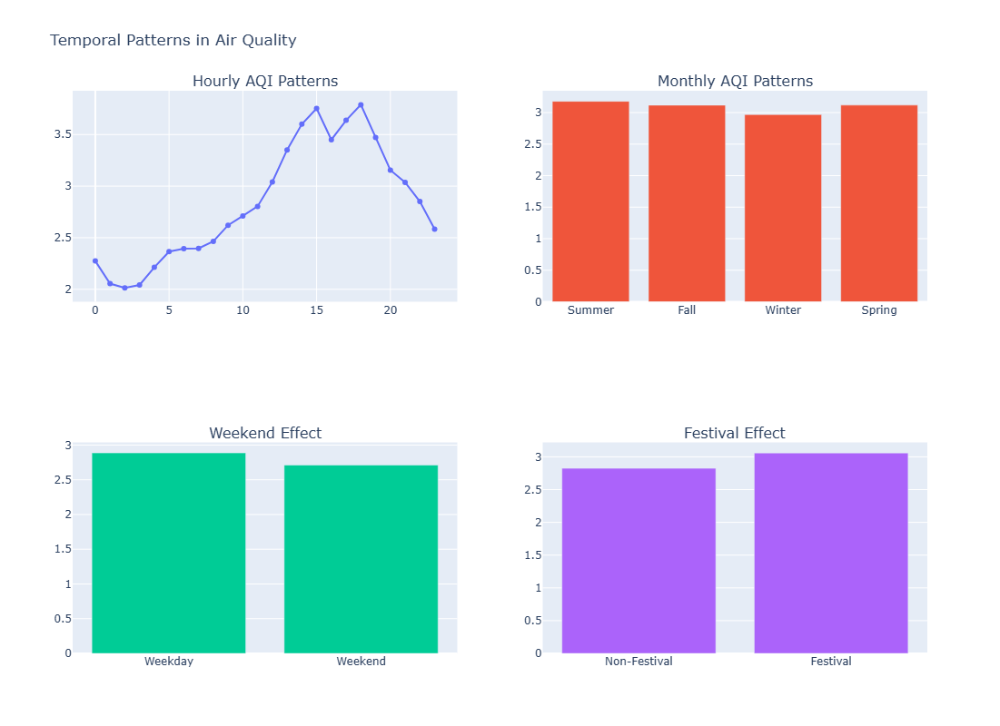

In [280]:
create_temporal_patterns_plot(df)

**Hourly AQI Trends** AQI seems lowest during early morning hours (0–5 AM), averaging around 2.0. It starts increasing after 6 AM, peaking around 3–6 PM (~3.75 at 15:00). A decline follows in the evening and night.

**Monthly AQI Trends** Higher AQI in winter months (Dec–Feb, ~3.2) and lower in mid-year (June–Sept, ~2.4). A possible reason: increased heating and stagnant air in winter vs. better air circulation in summer.

**Weekend vs. Weekday** Effect Weekends have slightly lower AQI (2.71) than weekdays (2.89). This could be due to reduced traffic and industrial activity.

**Festival Effect** AQI increases during festivals (3.06 vs. 2.82 on normal days). Likely due to fireworks, increased vehicular activity, and gatherings.

In [282]:
def create_pollutant_relationships_plot(df):
    fig = px.scatter_matrix(
        df,
        dimensions=['PM25_TLA', 'PM10_TLA', 'SO2_TLA', 'O3_TLA', 'NO2_TLA', 'CO_TLA'],
        color='AirQualityIndex',
        title="Relationships Between Different Pollutants"
    )
    fig.update_layout(height=1000, width=1000)
    return fig


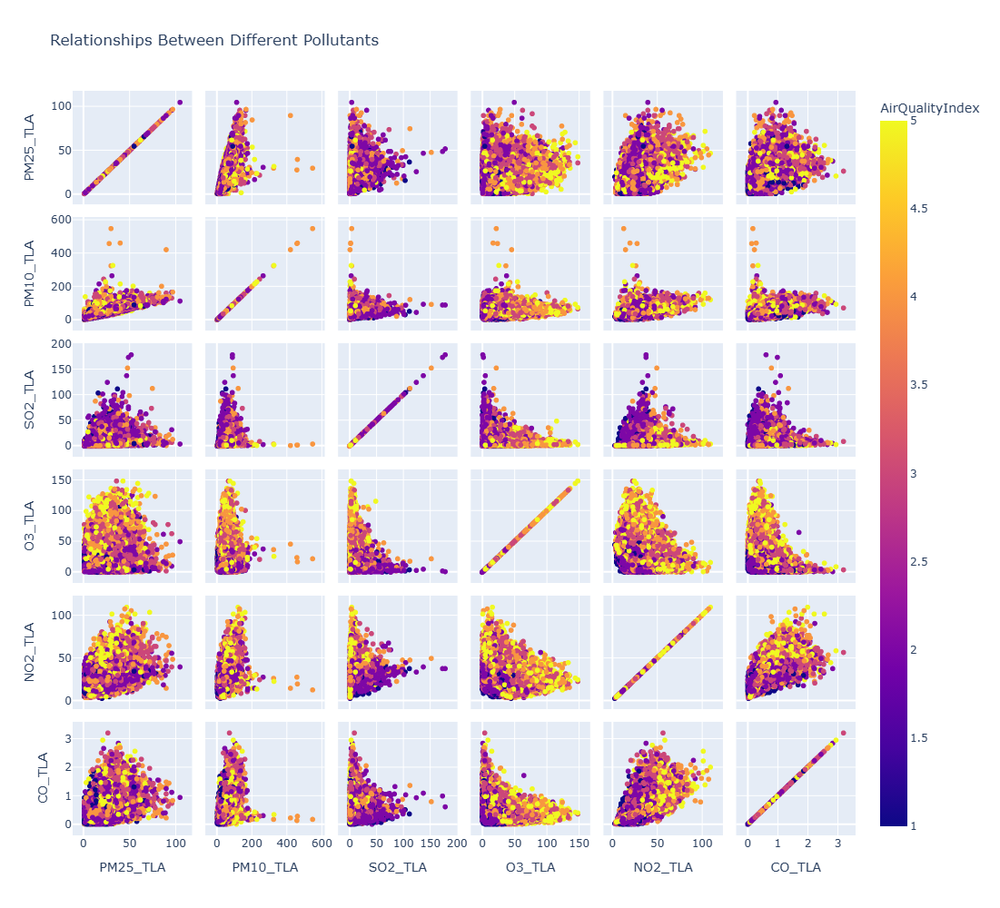

In [284]:
create_pollutant_relationships_plot(df)

# Key Insights from the Correlation Matrix:

**Strong Positive Correlations:**

**1. PM2.5 (PM25_TLA) & PM10 (PM10_TLA) → 0.77:** This suggests that when PM2.5 increases, PM10 also tends to increase. Both pollutants likely come from similar sources, such as **vehicle emissions and industrial activities.**
**2. NO2 (NO2_TLA) & CO (CO_TLA) → 0.68:** These pollutants are typically linked to **traffic and combustion processes,** indicating that vehicle emissions are a major contributor to air pollution.
**3. PM10 & NO2 → 0.51:** Indicates that high levels of PM10 are often associated with increased NO2, suggesting a common source like **fossil fuel combustion.**

**Moderate Positive Correlations:**

1. PM2.5 & NO2 → 0.48
2. PM2.5 & CO → 0.42
3. PM10 & CO → 0.49

These relationships further reinforce the idea that **combustion-related sources** are contributing to particulate matter and gaseous pollutants.
Weak or Negative Correlations:

**O3 (Ozone) vs. NO2 (-0.28) and CO (-0.26):** Ozone formation is complex and often occurs through photochemical reactions involving NO2 and volatile organic compounds (VOCs). This negative correlation suggests that as NO2 increases, O3 decreases, which aligns with the fact that **NO2 plays a role in both O3 formation and destruction.**

**O3 vs. SO2 (-0.11):** A weak negative relationship, likely because SO2 comes from industrial emissions, while O3 forms through atmospheric reactions involving sunlight.

**Takeaways:**
1. The strong correlations between PM2.5, PM10, NO2, and CO suggest that **traffic and combustion sources** are key pollution drivers.
2. Ozone behaves differently compared to other pollutants, which makes sense due to its **photochemical nature.**
3. If the goal is to target pollution reduction strategies, **focusing on vehicle emissions** could help decrease PM, NO2, and CO levels.

# Pollutant Levels (Hourly, Monthly)

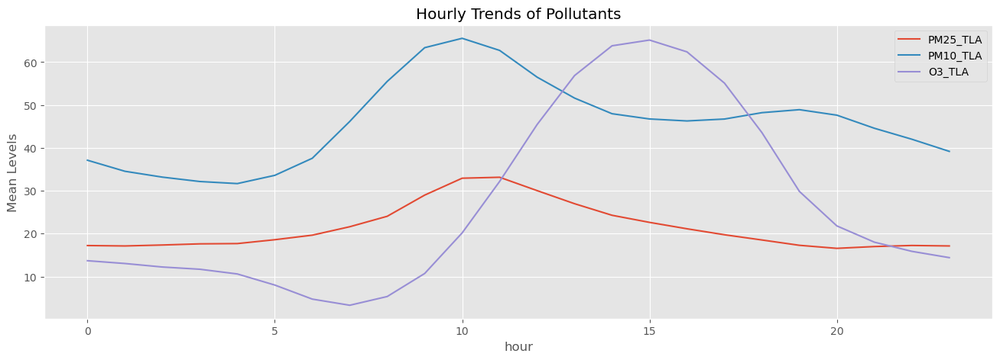

In [290]:
focused_columns = ['PM25_TLA', 'PM10_TLA', 'O3_TLA']
df = df[focused_columns + ['hour', 'Month', 'is_weekend', 'is_festival']]

hourly_means = df.groupby('hour')[focused_columns].mean()
hourly_means.plot(kind='line', figsize=(16, 5))
plt.title('Hourly Trends of Pollutants')
plt.ylabel('Mean Levels')
plt.show()

# Summary Statistics Insights:

**Hourly Trends:**

**1. PM2.5 and PM10** levels peak in the late morning (9-11 AM) and are highest between **9 AM and 12 PM.**
**2. O3** levels follow a different pattern, with low levels in the morning and a peak in the afternoon **(1-4 PM).**
**3. At night (12 AM - 6 AM),** all pollutants are lower, likely due to **decreased human activity (traffic, industry).**

**Possible Explanation:**

**1. Morning PM spikes:** Increased human activities **(traffic, industry).**
**2. Afternoon O3 peak:** Ozone forms due to **sunlight-driven photochemical reactions,** peaking in the hottest part of the day.

**Correlation Between Pollutants:**

1. **PM2.5 and PM10** have a strong positive correlation (0.77) → These pollutants likely come from the same sources **(traffic, combustion).**
2. **O3** has weak correlations with PM2.5 (0.18) and PM10 (0.13) → Ozone behaves differently and is more influenced by **sunlight and chemical reactions** than particulate matter.

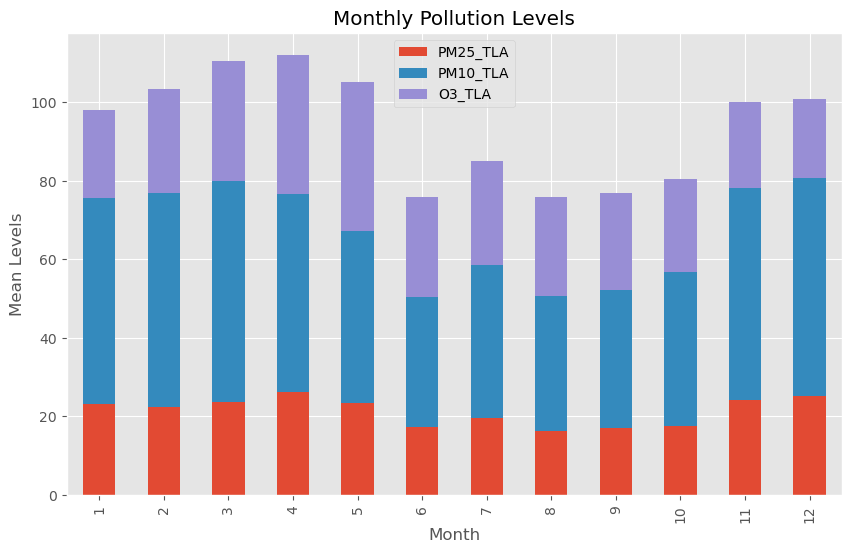

In [165]:
monthly_means = df.groupby('Month')[focused_columns].mean()
monthly_means.plot(kind='bar', figsize=(10, 6), stacked=True)
plt.title('Monthly Pollution Levels')
plt.ylabel('Mean Levels')
plt.xlabel('Month')
plt.show()

# Observations:

**PM2.5 (PM25_TLA) & PM10 (PM10_TLA)**

1. Highest levels: April (26.31 for PM2.5) and December (25.11 for PM2.5, 55.69 for PM10)
2. Lowest levels: August (16.39 for PM2.5, 34.16 for PM10)
3. Trend: Both pollutants **peak in winter** months (November–April) and **drop in summer** (June–September).

**Ozone (O3_TLA)**

1. Highest in May (37.89) and April (35.36), lowest in December (20.15) and November (21.70).
2. Trend: Ozone levels **increase in warmer months** (spring and early summer) and **decrease in colder months.**

**Possible Explanations:**

1. Winter increase in PM pollutants: Likely due to increased heating, lower dispersion, and stagnant air conditions.
2. Summer dip in PM pollutants: Possibly better air circulation and less fossil fuel combustion.
3. Spring and summer ozone peak: Ozone forms through sunlight-driven reactions, so higher temperatures increase its concentration.

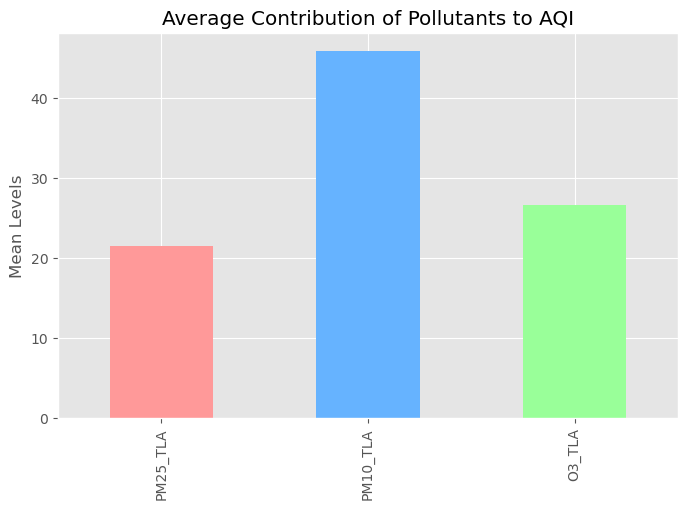

In [167]:
mean_contributions = df[focused_columns].mean()
mean_contributions.plot(kind='bar', figsize=(8, 5), color=['#FF9999', '#66B3FF', '#99FF99'])
plt.title('Average Contribution of Pollutants to AQI')
plt.ylabel('Mean Levels')
plt.show()

Average Contribution of Pollutants to AQI:
PM25_TLA    21.437649
PM10_TLA    45.809974
O3_TLA      26.579350
dtype: float64


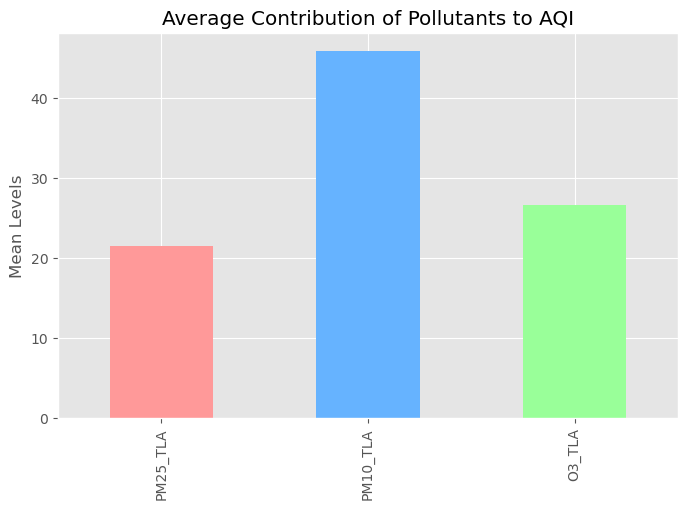

In [301]:
# Calculate mean contributions of pollutants
mean_contributions = df[focused_columns].mean()

# Print the mean contributions
print("Average Contribution of Pollutants to AQI:")
print(mean_contributions)

# Plot the mean contributions
mean_contributions.plot(kind='bar', figsize=(8, 5), color=['#FF9999', '#66B3FF', '#99FF99'])
plt.title('Average Contribution of Pollutants to AQI')
plt.ylabel('Mean Levels')
plt.show()


# Average Contribution of Pollutants to AQI:

**Insights:**

1. Dominance of **PM10:** The highest average contribution to AQI comes from PM10, indicating that this pollutant may have a **significant impact on air quality.**

**2. Balanced Contributions: PM2.5 and O3** also contribute to the AQI, but their levels are relatively lower compared to PM10. This suggests that while they are important, PM10 might be the primary concern in this dataset.
   
3. Potential Health Implications: High levels of PM10 and O3 can have **adverse health effects,** especially for vulnerable populations. Monitoring and controlling these pollutants could be crucial for improving air quality.

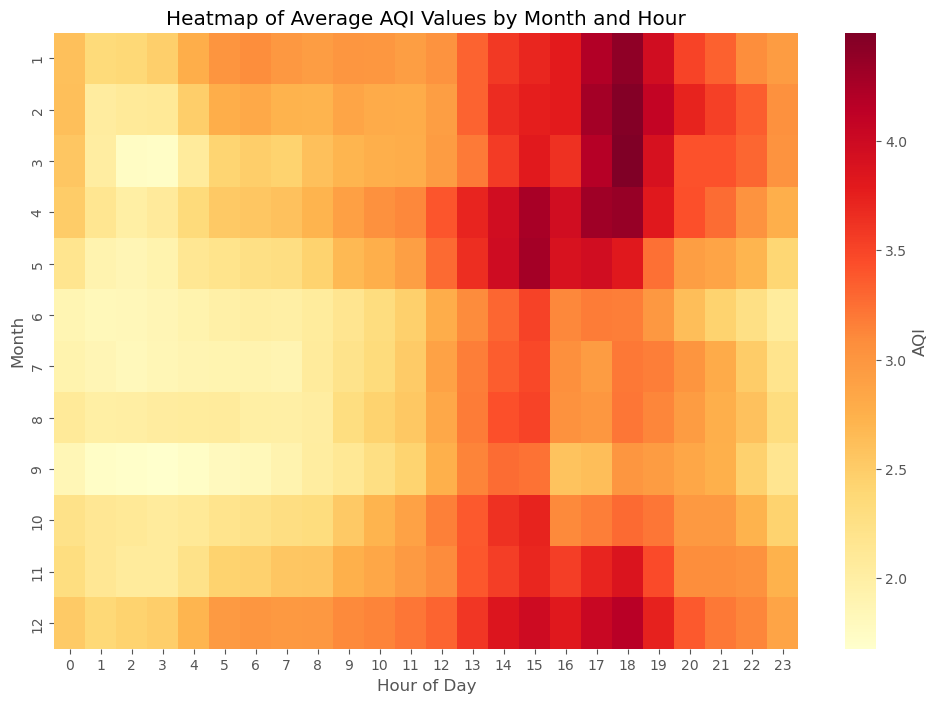

In [304]:
plt.figure(figsize=(12, 8))
sns.heatmap(monthly_hourly_aqi, cmap='YlOrRd', cbar_kws={'label': 'AQI'})
plt.title('Heatmap of Average AQI Values by Month and Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.show()


# Summary Statistics for Monthly Hourly AQI:
**The table presents statistics for AQI values across different hours, with the following insights:**
Mean AQI: Values range from approximately 2.004 to 3.979, with peak values occurring in the afternoon and early evening hours.
Standard Deviation: Indicates variability in AQI levels throughout the day, with higher variability during peak hours (e.g., hours 14-18).
Minimum and Maximum: AQI levels fluctuate from as low as 1.700 to as high as 4.494, suggesting significant differences in pollution levels throughout the day.

**Mean AQI Values by Month:**
The average AQI for each month shows the following trends:
Highest Average AQI: December (3.209) indicates the worst air quality conditions during this month.
Lowest Average AQI: June (2.451) suggests comparatively better air quality.
The AQI values generally decline from January to June and then gradually rise again towards the end of the year.

**Mean AQI Values by Hour:**
Average AQI values across hours reveal:
Peak AQI Hours: The highest average AQI values are recorded between 14:00 and 18:00, indicating increased pollution levels during these hours.
Lowest AQI Hours: The lowest averages are observed during the early morning hours (around 1:00 - 3:00), reflecting lower traffic and industrial activities.

**Overall Insights:**
The analysis indicates a clear temporal pattern in AQI levels, with significant differences across both monthly and hourly data.
The increased AQI during specific hours suggests **potential periods of higher emissions and pollution,** warranting further investigation into local activities or weather conditions contributing to these peaks.

# Overall Summary of Findings for the TLA Station

**Monthly Pollution Levels:**

1. Trends Over Months: The analysis of monthly mean pollutant levels (PM2.5, PM10, and O3) reveals fluctuations throughout the year. Significant peaks were noted in certain months, with variations in each pollutant's levels.
2. Highest Pollutant Levels: Notably, **April** exhibited the highest levels of PM2.5 (26.31) and PM10 (56.29), while O3 reached its peak in **March** (30.72).
3. Seasonal Patterns: There is a noticeable seasonal variation, with **higher pollutant levels in the spring months,** which may be linked to increased industrial activities or weather conditions.

**Average Contribution to Air Quality Index (AQI):** 

1. Contribution by Pollutants: The average contribution of pollutants to the AQI shows that PM10 has the highest mean level (45.81), followed by O3 (26.58) and PM2.5 (21.44). This indicates **PM10's significant impact on air quality at the TLA station.**
2. Pollutant Prioritization: Effective air quality management strategies should prioritize controlling PM10 emissions, given its substantial contribution to the overall AQI.

**Hourly AQI Analysis:**

1. Peak Hours for Pollution: The hourly analysis indicates that pollution levels, as represented by AQI, **peak in the afternoon and early evening (hours 14:00 - 18:00).** This trend suggests increased vehicular and industrial activity during these times.
2. Lowest AQI Values: Conversely, early morning hours **(around 1:00 - 3:00)** show the lowest AQI values, reflecting reduced human activity and emissions.

**Heatmap Insights:**

AQI Heatmap: The heatmap analysis illustrated clear patterns in AQI values across different months and hours, highlighting critical times for air quality management. The highest **AQI values correlate with afternoon and evening hours** across most months, emphasizing periods when interventions may be most necessary.

**Overall Implications:**

1. Air Quality Concerns: The findings underscore the need for **targeted air quality interventions during specific months and hours** to mitigate pollution impacts.
2. Recommendations: Strategies may include **enhancing regulations** during peak pollution times, **promoting cleaner transportation options,** and **raising public awareness** about pollution levels and health impacts.

**Conclusion**

The comprehensive analysis of pollutant levels and their contributions to the AQI at the TLA station reveals important insights into the temporal dynamics of air quality. These findings provide a valuable foundation for developing effective policies and strategies to improve air quality and protect public health.